# Comparison velocities and acceleration before and after correction (99.99% percentile for velocities, 90 for acceleration)
- Trajectories
- Nrj map
- Spectra
- map of nan values

In [1]:
import os
from glob import glob

import numpy as np
import pandas as pd
import xarray as xr
import dask.dataframe as dd
import dask.array as da

import cartopy.crs as ccrs
import cartopy.feature as cfeature
import geopandas as gpd
from shapely.geometry import Polygon

%matplotlib inline
from matplotlib import pyplot as plt
import hvplot.pandas
import holoviews as hv


import drifters.utils as ut
import pynsitu as pin

from dask.delayed import delayed

import GDP_lib as gdp

from GDP_lib import root_dir

In [2]:
from dask.distributed import Client

if True:
    from dask_jobqueue import PBSCluster
    from dask.distributed import Client

    # cluster = PBSCluster()
    # w = cluster.scale(jobs=3) # 2 not enough for lon, lat, year, binning
    cluster = PBSCluster(cores=3, processes=3, walltime="04:00:00")
    w = cluster.scale(jobs=8)
else:
    from dask.distributed import LocalCluster

    cluster = LocalCluster()

client = Client(cluster)
client

/home1/datahome/mdemol/.miniconda3/envs/mdenv/lib/python3.9/site-packages/dask_jobqueue/core.py:237: FutureWarning: extra has been renamed to worker_extra_args. You are still using it (even if only set to []; please also check config files). If you did not set worker_extra_args yet, extra will be respected for now, but it will be removed in a future release. If you already set worker_extra_args, extra is ignored and you can remove it.
  warnings.warn(warn, FutureWarning)
/home1/datahome/mdemol/.miniconda3/envs/mdenv/lib/python3.9/site-packages/dask_jobqueue/core.py:255: FutureWarning: job_extra has been renamed to job_extra_directives. You are still using it (even if only set to []; please also check config files). If you did not set job_extra_directives yet, job_extra will be respected for now, but it will be removed in a future release. If you already set job_extra_directives, job_extra is ignored and you can remove it.
  warnings.warn(warn, FutureWarning)
/home1/datahome/mdemol/.min

Connection method: Cluster object,Cluster type: dask_jobqueue.PBSCluster
Dashboard: http://10.148.0.235:8787/status,
Dashboard: http://10.148.0.235:8787/status,Workers: 0
Total threads: 0,Total memory: 0 B
Comm: tcp://10.148.0.235:53218,Workers: 0
Dashboard: http://10.148.0.235:8787/status,Total threads: 0
Started: Just now,Total memory: 0 B


In [3]:
def geo_plot(d_array, title="", legend="", **kwargs):
    fig = plt.figure(figsize=(15, 5))
    ax = fig.add_subplot(1, 1, 1, projection=ccrs.EckertIII(central_longitude=-180))
    ax.add_feature(cfeature.LAND, zorder=2)
    d_array.rename(legend).plot(
        x="lon_bins", y="lat_bins", **kwargs, ax=ax, transform=ccrs.PlateCarree()
    )
    ax.set_extent([1e-4, -1e-4, -90, 90], ccrs.PlateCarree())
    ax.set_title(title, fontsize=15)
    gl = ax.gridlines(
        draw_labels=True,
    )

In [4]:
parquet_argos = os.path.join(root_dir, "argos_av_time_corrected.parquet")
parquet_gps = os.path.join(root_dir, "gps_av_time_corrected.parquet")
dfgc = dd.read_parquet(parquet_gps).reset_index().set_index("id").persist()
dfac = dd.read_parquet(parquet_argos).reset_index().set_index("id").persist()

parquet_argos = os.path.join(root_dir, "argos_av_time.parquet")
parquet_gps = os.path.join(root_dir, "gps_av_time.parquet")
dfg = dd.read_parquet(parquet_gps).reset_index().set_index("id").persist()
dfa = dd.read_parquet(parquet_argos).reset_index().set_index("id").persist()

In [24]:
dfg

,id,lon,lat,ve,vn,typebuoy,gap,deploy_date,deploy_lat,deploy_lon,end_date,end_lat,end_lon,drogue_lost_date,typedeath,lon360,err_lat,err_lon,err_ve,err_vn,x,y,vex,vny,vxy,ae,an,aen,aex,any,axy,ae_vex,an_vny,aen_vxy,dt,vex_diff,vny_diff,vxy_diff
npartitions=193,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,int64,float32,float32,float32,float32,object,float64,datetime64[ns],float64,float64,datetime64[ns],float64,float64,datetime64[ns],float64,float32,float32,float32,float32,float32,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...


___
#

In [5]:
df = dfg
perca = 0.90
q99_aex = df["aex"].quantile(perca).compute()
q99_any = df["any"].quantile(perca).compute()
perc = 0.9999
q99_vex = df["vex"].quantile(perc).compute()
q99_vny = df["vny"].quantile(perc).compute()

test = (abs(df["vex"]) > q99_vex) | (abs(df["vny"]) > q99_vny)
modified_id = dfg[test].index.unique().compute()

_____
# Trajectories

In [6]:
# CHOOSE TRAJ HERE
_id = modified_id[10]

df_ = dfg.groupby("id").get_group(_id).reset_index().set_index("time").compute()
dfr_ = (
    dfgc.groupby("id")
    .get_group(_id)
    .rename(
        columns={
            "x": "x_c",
            "y": "y_c",
            "vex": "vex_c",
            "vny": "vny_c",
            "aex": "aex_c",
            "any": "any_c",
        }
    )
    .reset_index()
    .set_index("time")
    .compute()
)

hvplot = (
    df_["x"].hvplot(grid=True, kind="scatter")
    * dfr_["x_c"].hvplot(grid=True, kind="scatter")
    + df_["y"].hvplot(grid=True, kind="scatter")
    * dfr_["y_c"].hvplot(grid=True, kind="scatter")
    + df_["ve"].hvplot(grid=True, kind="scatter")
    * df_["vex"].hvplot(grid=True, kind="scatter")
    * dfr_["vex_c"].hvplot(grid=True, kind="scatter")
    + df_["vn"].hvplot(grid=True, kind="scatter")
    * df_["vny"].hvplot(grid=True, kind="scatter")
    * dfr_["vny_c"].hvplot(grid=True, kind="scatter")
    + df_["ae"].hvplot(grid=True, kind="scatter")
    * df_["aex"].hvplot(grid=True, kind="scatter")
    * dfr_["aex_c"].hvplot(grid=True, kind="scatter")
    + df_["an"].hvplot(grid=True, kind="scatter")
    * df_["any"].hvplot(grid=True, kind="scatter")
    * dfr_["any_c"].hvplot(grid=True, kind="scatter")
)
layout = hv.Layout(hvplot).cols(2)
print(_id)
layout

11027150


:Layout
   .Overlay.I   :Overlay
      .Scatter.X   :Scatter   [time]   (x)
      .Scatter.X_c :Scatter   [time]   (x_c)
   .Overlay.II  :Overlay
      .Scatter.Y   :Scatter   [time]   (y)
      .Scatter.Y_c :Scatter   [time]   (y_c)
   .Overlay.III :Overlay
      .Scatter.Ve    :Scatter   [time]   (ve)
      .Scatter.Vex   :Scatter   [time]   (vex)
      .Scatter.Vex_c :Scatter   [time]   (vex_c)
   .Overlay.IV  :Overlay
      .Scatter.Vn    :Scatter   [time]   (vn)
      .Scatter.Vny   :Scatter   [time]   (vny)
      .Scatter.Vny_c :Scatter   [time]   (vny_c)
   .Overlay.V   :Overlay
      .Scatter.Ae    :Scatter   [time]   (ae)
      .Scatter.Aex   :Scatter   [time]   (aex)
      .Scatter.Aex_c :Scatter   [time]   (aex_c)
   .Overlay.VI  :Overlay
      .Scatter.An    :Scatter   [time]   (an)
      .Scatter.Any   :Scatter   [time]   (any)
      .Scatter.Any_c :Scatter   [time]   (any_c)

_____
## Energies per drifters


In [21]:
df_gps["ve2"] = df_gps.ve**2
df_gps["vn2"] = df_gps.vn**2
df_gps["vex2"] = df_gps.vex**2
df_gps["vny2"] = df_gps.vny**2

__________
## Global mean/variance/std 
- no significative difference between ven (Elipot computation) and vxy (differenciation)
- difference between aen (Elipot computation differentiation) and axy (differenciation) -> difference centered or double differenciation methods ?

In [8]:
def print_mean_var(df):
    for l in df.columns:
        print(
            l
            + f": mean = {df[l].mean().compute()}, variance = {df[l].var().compute()}, std = {df[l].std().compute()}"
        )

In [9]:
print_mean_var(dfg[["ve", "vn", "ae", "an", "vex", "vny", "aex", "any"]])

ve: mean = 0.012002576426239328, variance = 0.06278202682733536, std = 0.2505634129047394
vn: mean = 0.003376518326194464, variance = 0.04788835346698761, std = 0.2188340723514557
ae: mean = -3.1948585270785935e-10, variance = 1.4282326858221514e-10, std = 1.1950868946742539e-05
an: mean = -5.767887936487578e-10, variance = 1.4387723932139378e-10, std = 1.1994883881113388e-05
vex: mean = 0.01217005786265269, variance = 0.06420608895118776, std = 0.2533892044882492
vny: mean = 0.00338297676445427, variance = 0.048083386843175965, std = 0.21927924398623772
aex: mean = 1.0757460561458263e-09, variance = 5.529398568286806e-10, std = 2.3514673223939997e-05
any: mean = -9.131263816490752e-10, variance = 4.576630623060713e-10, std = 2.1393061078444836e-05


In [10]:
print_mean_var(dfgc[["ve", "vn", "ae", "an", "vex", "vny", "aex", "any"]])

ve: mean = 0.012002576426239328, variance = 0.06278202682733536, std = 0.2505634129047394
vn: mean = 0.0033765179377891227, variance = 0.04788835346698761, std = 0.2188340723514557
ae: mean = -3.194858527078592e-10, variance = 1.428232685822151e-10, std = 1.1950868946742539e-05
an: mean = -5.767887936487577e-10, variance = 1.4387723932139378e-10, std = 1.1994883881113388e-05
vex: mean = 0.012072773442135958, variance = 0.06175644087810515, std = 0.24850843220724955
vny: mean = 0.0033625999172355986, variance = 0.046453698748543125, std = 0.21553120133415282
aex: mean = -3.924021867483557e-09, variance = 1.536475799556449e-10, std = 1.2395466104816103e-05
any: mean = -6.19469970631326e-09, variance = 1.5985430824918064e-10, std = 1.2643350356973448e-05


In [11]:
print_mean_var(dfa[["ve", "vn", "ae", "an", "vex", "vny", "aex", "any"]])

ve: mean = 0.005651816941943322, variance = 0.07456154376268387, std = 0.273059606552124
vn: mean = 0.005226139631492987, variance = 0.052446842193603516, std = 0.22901275753974915
ae: mean = -3.262172484019282e-10, variance = 3.0432870656485433e-10, std = 1.744501953466531e-05
an: mean = 1.1976533857878918e-10, variance = 2.321639555502964e-10, std = 1.5236927365787907e-05
vex: mean = 0.005620668874696608, variance = 0.07553586716439788, std = 0.27483789251920465
vny: mean = 0.005197181212136332, variance = 0.052974507001310685, std = 0.2301619147498358
aex: mean = -1.123580954148553e-09, variance = 2.4721730341222866e-09, std = 4.9720951661470505e-05
any: mean = 1.072112098758145e-10, variance = 1.5566399866496653e-09, std = 3.945427716546921e-05


In [12]:
print_mean_var(dfac[["ve", "vn", "ae", "an", "vex", "vny", "aex", "any"]])

ve: mean = 0.0056518179518047894, variance = 0.07456155121326447, std = 0.273059606552124
vn: mean = 0.005226139631492987, variance = 0.052446842193603516, std = 0.22901275753974915
ae: mean = -3.262172484019284e-10, variance = 3.0432870656485433e-10, std = 1.744501953466531e-05
an: mean = 1.1976533857878955e-10, variance = 2.3216395555029642e-10, std = 1.5236927365787907e-05
vex: mean = 0.005581406833718299, variance = 0.07480578379616262, std = 0.27350646024575476
vny: mean = 0.005185965069115027, variance = 0.052082393400520684, std = 0.22821567299491216
aex: mean = 2.882417533665318e-09, variance = 1.9237322739160673e-09, std = 4.386037247808171e-05
any: mean = -1.3015902071610772e-09, variance = 1.1338967570083258e-09, std = 3.367338350995227e-05


In [13]:
listv = ["ve", "vex", "vex_diff", "vn", "vny", "vny_diff"]
lista = ["ae", "aex", "an", "any", "ae_vex", "an_vny"]


def list_std(df, listv_=listv, lista_=lista):
    stdv = []
    for l in listv_:
        stdv.append(df[l].std().compute())
    stda = []
    for l in lista_:
        stda.append(df[l].std().compute())
    return np.array(stdv), np.array(stda)


stdv_a, stda_a = list_std(dfa)
stdv_g, stda_g = list_std(dfg)
stdv_ac, stda_ac = list_std(dfac)
stdv_gc, stda_gc = list_std(dfgc)

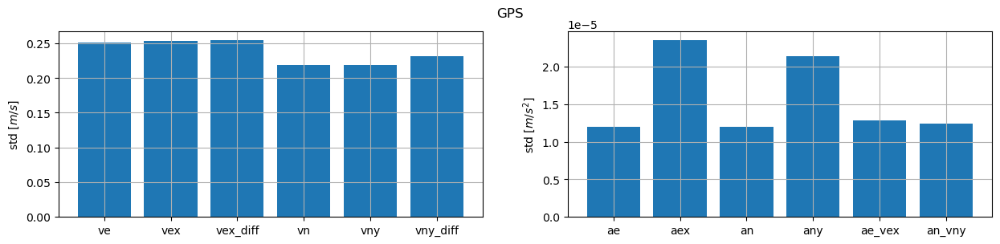

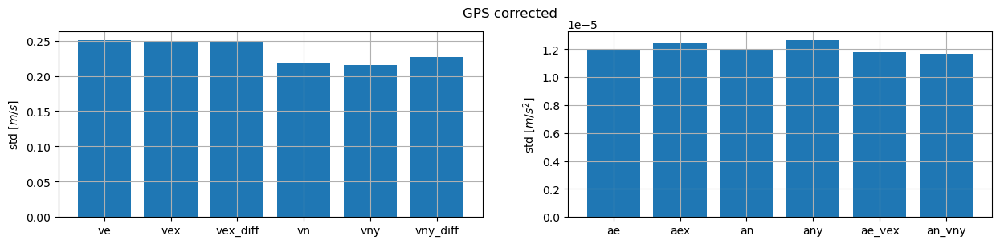

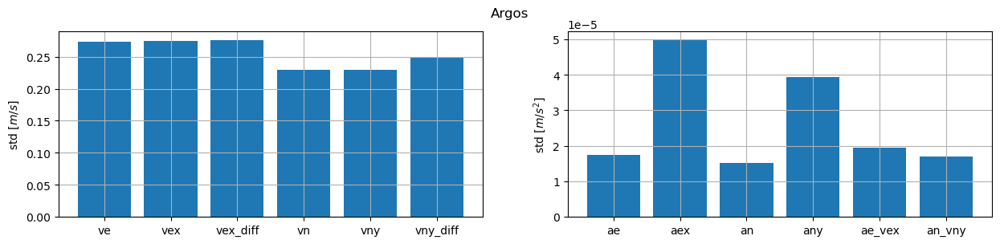

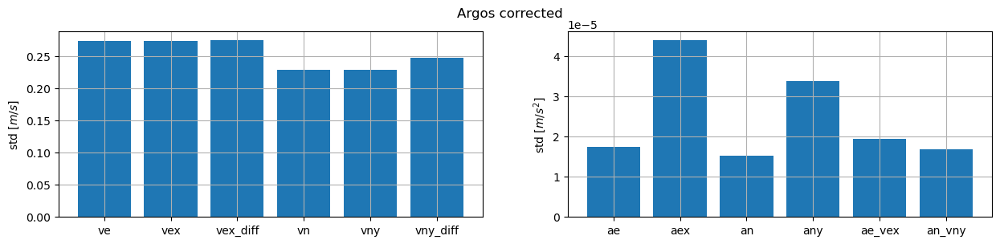

In [15]:
def print_std(listv, stdv, lista, stda, title):
    fig, axs = plt.subplots(1, 2, figsize=(15, 3))
    axs = axs.flatten()
    axs[0].grid()
    axs[1].grid()
    axs[0].bar(listv, stdv)
    axs[1].bar(lista, stda)
    axs[0].set_ylabel(r"std $[m/s]$")
    axs[1].set_ylabel(r"std $[m/s^2]$")
    fig.suptitle(title)


print_std(listv, stdv_g, lista, stda_g, "GPS")
print_std(listv, stdv_gc, lista, stda_gc, "GPS corrected")
print_std(listv, stdv_a, lista, stda_a, "Argos")
print_std(listv, stdv_ac, lista, stda_ac, "Argos corrected")

- $a_{e,n}$ are computed from ve,n by a centered differenciation :
$$ \langle a^2_{e,n} \rangle = \frac{\langle v_{e,n}^2 \rangle - C_u(2dt)}{2dt^2}$$
- $a_{x,y}$ are computed from x,y by two simple differenciations :
$$ \langle a^2_{x,y} \rangle = 2\frac{\langle v_{x,y}^2 \rangle - C_u(dt)}{dt^2}$$

This might explain the observed difference

___
# Nrj maps

In [6]:
zarr_argosc = os.path.join(root_dir, "argos_geospectra_2_corrected.zarr")
zarr_gps = os.path.join(root_dir, "gps_geospectra_2.zarr")
zarr_gpsc = os.path.join(root_dir, "gps_geospectra_2_corrected.zarr")
zarr_argos = os.path.join(root_dir, "argos_geospectra_2.zarr")
dsg = xr.open_zarr(zarr_gps).persist()
dsgc = xr.open_zarr(zarr_gpsc).persist()
dsa = xr.open_zarr(zarr_argos).persist()
dsac = xr.open_zarr(zarr_argosc).persist()

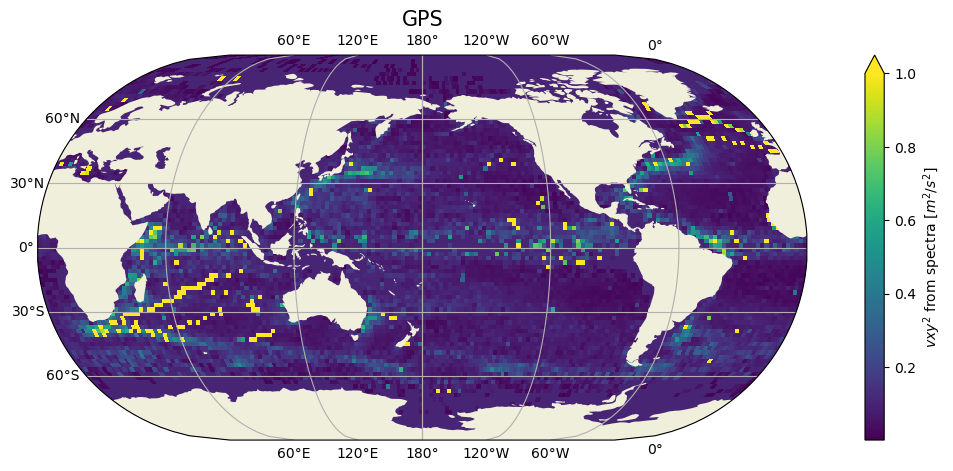

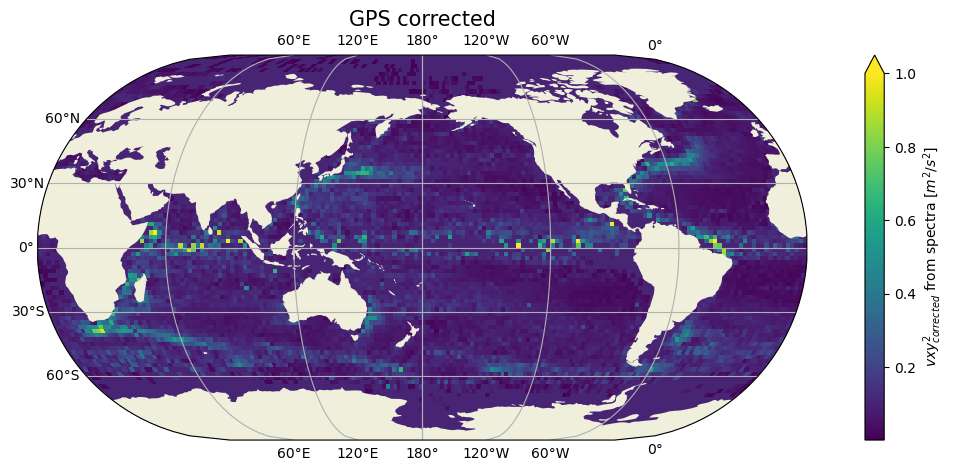

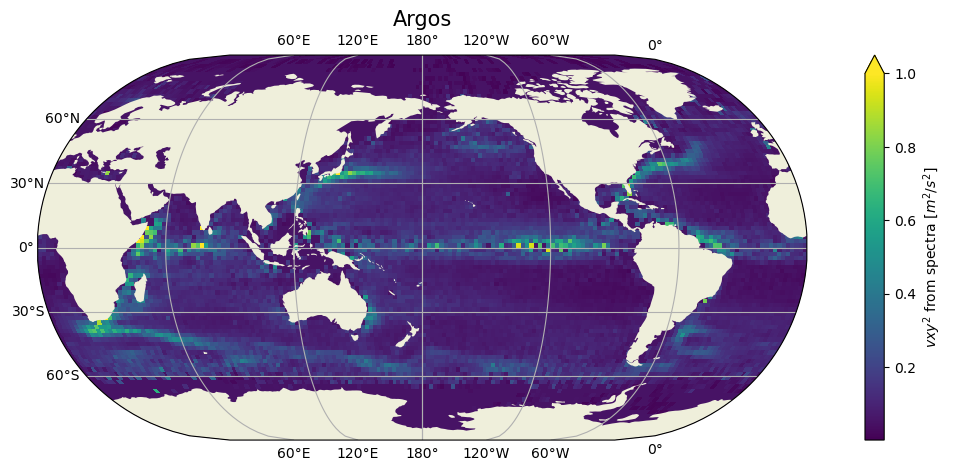

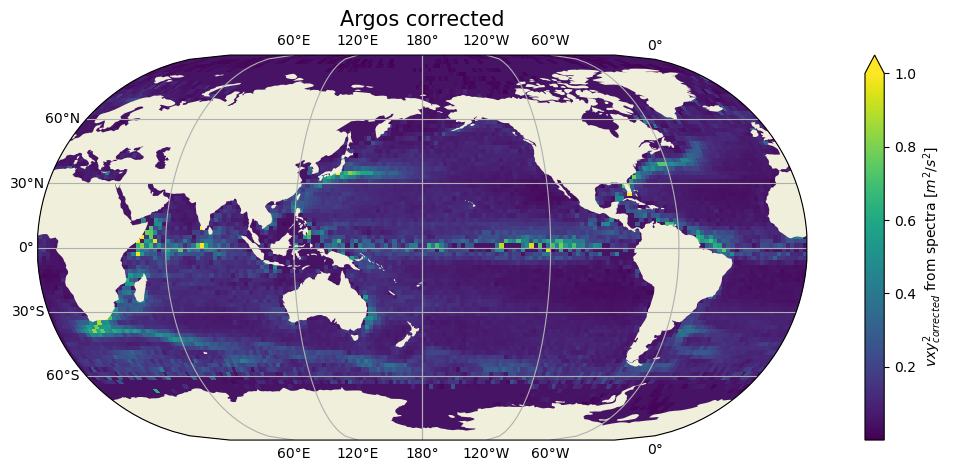

In [23]:
geo_plot(
    dsg.E_vxy.integrate("frequency"),
    legend=r"$vxy^2$ from spectra [$m^2/s^2$]",
    title="GPS",
    vmax=1,
)

geo_plot(
    dsgc.E_vxy.integrate("frequency"),
    legend=r"$vxy^2_{corrected}$ from spectra [$m^2/s^2$]",
    title="GPS corrected",
    vmax=1,
)

geo_plot(
    dsa.E_vxy.integrate("frequency"),
    legend=r"$vxy^2$ from spectra [$m^2/s^2$]",
    title="Argos",
    vmax=1,
)

geo_plot(
    dsac.E_vxy.integrate("frequency"),
    legend=r"$vxy^2_{corrected}$ from spectra [$m^2/s^2$]",
    title="Argos corrected",
    vmax=1,
)

___
# Spectra

Text(0.5, 1.0, 'Argos')

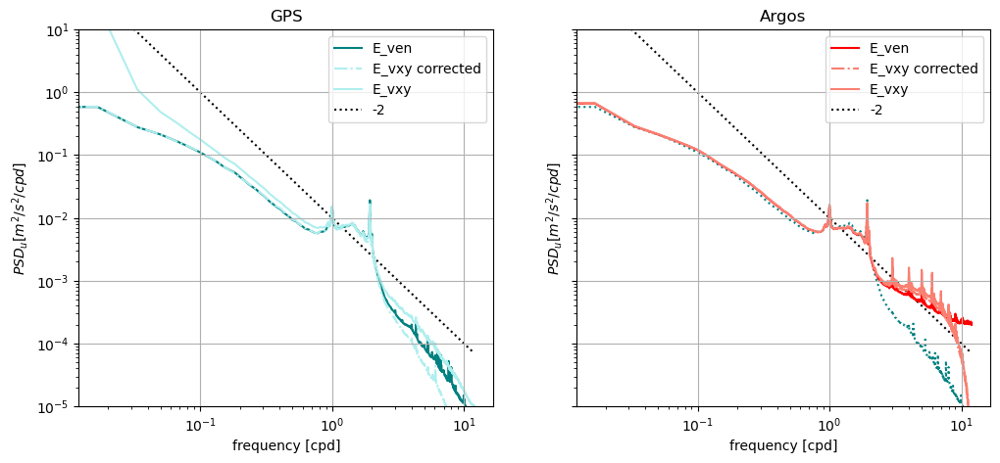

In [7]:
fig, ax = plt.subplots(1, 2, sharey=True, figsize=(12, 5))
ax = ax.flatten()

dsgc.E_ven.mean(["lon_bins", "lat_bins"]).plot(
    label="E_ven", color="teal", ax=ax[0], zorder=1
)
dsgc.E_vxy.mean(["lon_bins", "lat_bins"]).plot(
    label="E_vxy corrected", color="paleturquoise", ls="-.", ax=ax[0], zorder=1
)
dsg.E_vxy.mean(["lon_bins", "lat_bins"]).plot(
    label="E_vxy", color="paleturquoise", ax=ax[0], zorder=1
)


dsgc.E_ven.mean(["lon_bins", "lat_bins"]).plot(ls=":", color="teal", ax=ax[1], zorder=1)
dsac.E_ven.mean(["lon_bins", "lat_bins"]).plot(
    label="E_ven", color="red", ax=ax[1], zorder=1
)
dsac.E_vxy.mean(["lon_bins", "lat_bins"]).plot(
    label="E_vxy corrected", color="salmon", ls="-.", ax=ax[1], zorder=1
)
dsa.E_vxy.mean(["lon_bins", "lat_bins"]).plot(
    label="E_vxy", color="salmon", ax=ax[1], zorder=1
)
for a in ax:
    a.grid()
    a.set_xlabel("Frequency [cpd]")
    a.set_xscale("log")
    a.set_yscale("log")
    (1 / dsac.frequency**2 * 1e-2).plot(ax=a, label="-2", ls=":", color="k", zorder=0)
    # (1 / dsac.frequency * 1e-1).plot(ax=a, label="-1", ls=":", color = 'grey')
    a.set_ylim((1e-5, 1e1))
    a.set_ylabel(r"$PSD_u [m^2/s^2/cpd]$")
    a.legend()

ax[0].set_title("GPS")
ax[1].set_title("Argos")

Text(0.5, 1.0, 'Argos')

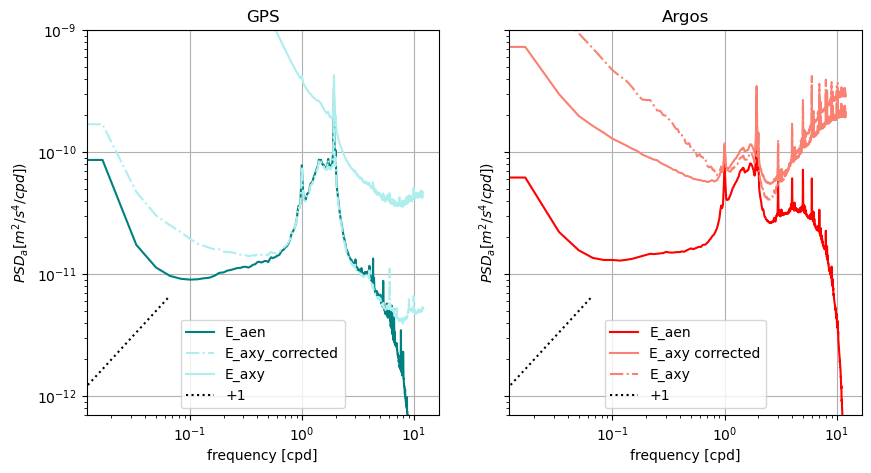

In [10]:
fig, ax = plt.subplots(1, 2, sharey=True, figsize=(10, 5))
ax = ax.flatten()

dsgc.E_aen.mean(["lon_bins", "lat_bins"]).plot(label="E_aen", color="teal", ax=ax[0])
dsgc.E_axy.mean(["lon_bins", "lat_bins"]).plot(
    label="E_axy_corrected", ls="-.", color="paleturquoise", ax=ax[0]
)
dsg.E_axy.mean(["lon_bins", "lat_bins"]).plot(
    label="E_axy", color="paleturquoise", ax=ax[0]
)

dsac.E_aen.mean(["lon_bins", "lat_bins"]).plot(label="E_aen", color="red", ax=ax[1])
dsac.E_axy.mean(["lon_bins", "lat_bins"]).plot(
    label="E_axy corrected", color="salmon", ax=ax[1]
)
dsa.E_axy.mean(["lon_bins", "lat_bins"]).plot(
    label="E_axy", ls="-.", color="salmon", ax=ax[1]
)

for a in ax:
    a.grid()
    a.set_xlabel("Frequency [cpd]")
    a.set_xscale("log")
    a.set_yscale("log")
    (dsac.frequency.isel(frequency=slice(0, 725)) * 1e-10).plot(
        ax=a, label="+1", ls=":", color="k"
    )
    # (dsac.frequency.isel(frequency= slice(0,725))**0 * 1e-10).plot(ax=a, label="+1", ls=":", color='k')
    # (dsac.frequency**4 * 1e-9).plot(ax=a, label="+4", ls="--")
    a.legend()
    a.set_ylim(7 * 1e-13, 1e-9)
    a.set_ylabel(r"$PSD_a [m^2/s^4/cpd]$)")
ax[0].set_title("GPS")
ax[1].set_title("Argos")

___
### Map of nan value pourcentage


In [25]:
dfgc.vex.isnull().sum().compute()

1209022

In [30]:
def nan_ratio(df):
    df = df.copy()
    df["nan_vex"] = df.vex.isnull().sum() / len(df)
    df["nan_vny"] = df.vny.isnull().sum() / len(df)
    df["nan_vn"] = df.vn.isnull().sum() / len(df)
    df["nan_ve"] = df.ve.isnull().sum() / len(df)
    return df

In [31]:
df = (
    dfgc[["lon", "lat", "vn", "ve", "vex", "vny", "time"]]
    .get_partition(0)
    .groupby("id")
    .get_group(22192)
    .compute()
)
meta = nan_ratio(df)
dfg_ = (
    dfgc[["lon", "lat", "vn", "ve", "vex", "vny", "time"]]
    .groupby("id")
    .apply(nan_ratio, meta=meta)
)

In [33]:
l_var = [
    "nan_vex",
    "nan_vny",
    "nan_vn",
    "nan_ve",
]
dsg_ = (
    dfg_[["lon", "lat"] + l_var]
    .groupby(["lon", "lat"])
    .mean()
    .reset_index()
    .rename(columns={"lon": "lon_bins", "lat": "lat_bins"})
    .compute()
    .to_xarray()
    .set_index(index=["lon_bins", "lat_bins"])
    .unstack()
)

MemoryError: Unable to allocate 1.91 PiB for an array with shape (20945400, 12808419) and data type float64

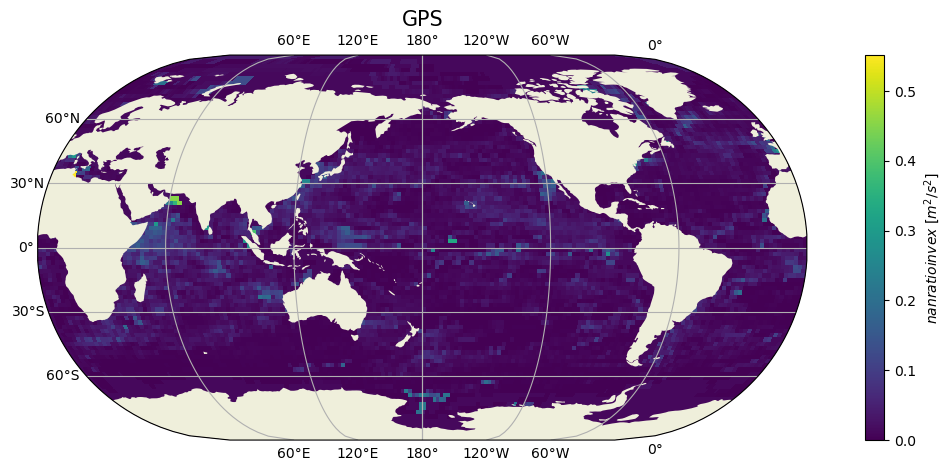

In [53]:
geo_plot(
    dsg_["nan_vny"],
    legend=r"$nan ratio in vex$ [$m^2/s^2$]",
    title="GPS",
)

In [11]:
cluster.close()

/home1/datahome/mdemol/.miniconda3/envs/mdenv/lib/python3.9/site-packages/dask_jobqueue/core.py:237: FutureWarning: extra has been renamed to worker_extra_args. You are still using it (even if only set to []; please also check config files). If you did not set worker_extra_args yet, extra will be respected for now, but it will be removed in a future release. If you already set worker_extra_args, extra is ignored and you can remove it.
  warnings.warn(warn, FutureWarning)
/home1/datahome/mdemol/.miniconda3/envs/mdenv/lib/python3.9/site-packages/dask_jobqueue/core.py:255: FutureWarning: job_extra has been renamed to job_extra_directives. You are still using it (even if only set to []; please also check config files). If you did not set job_extra_directives yet, job_extra will be respected for now, but it will be removed in a future release. If you already set job_extra_directives, job_extra is ignored and you can remove it.
  warnings.warn(warn, FutureWarning)
/home1/datahome/mdemol/.min